###### Simone Liuzzi 2/7/17

## The data and the challenge

I have downloaded from http://tomslee.net/airbnb-data-collection-get-the-data all the data available for the european cities of Amsterdam, Barcelona, Berlin, Dublin, Edinburgh, Geneva, Lisbon, London, Lyon, Madrid, Paris, Rome, Turin, Venice, Vienna and Zurich.

The data has been unzipped and merged in a file that has been uploaded at https://s3.eu-west-2.amazonaws.com/airbnbchallenge/abnb_listings.csv 

The idea is to understand the evolution of the market over time, and what drives the price of the listings

#### Loading the data

Let's load the data in a pandas dataframe

In [8]:
import pandas as pd  #necessary libraries
import numpy as np 

#importing the data
listings = pd.read_csv("https://s3.eu-west-2.amazonaws.com/airbnbchallenge/abnb_listings.csv", sep=",", low_memory=False)

#### Inspecting the data

In [9]:
listings.head(5)

,Unnamed: 0,accommodates,bathrooms,bedrooms,borough,city,country,host_id,last_modified,latitude,...,longitude,minstay,name,neighborhood,overall_satisfaction,price,reviews,room_id,room_type,survey_id
0,0.0,2.0,NaN,1.0,NaN,amsterdam,NaN,3159.0,2014-05-24 14:44:31.832,52.365755,...,4.941419,3.0,NaN,Oostelijk Havengebied / Indische Buurt,5.0,90.0,77,2818,Private room,NaN
1,1.0,4.0,NaN,1.0,NaN,amsterdam,NaN,3813.0,2014-05-24 17:16:02.491,52.379212,...,4.926324,2.0,NaN,Oostelijk Havengebied / Indische Buurt,4.5,75.0,116,6243,Private room,NaN
2,2.0,4.0,NaN,1.0,NaN,amsterdam,NaN,59297.0,2014-05-24 20:01:54.098,52.382685,...,4.876130,2.0,NaN,Westerpark,5.0,66.0,53,15061,Private room,NaN
3,3.0,4.0,NaN,1.0,NaN,amsterdam,NaN,59484.0,2014-05-24 21:52:07.540,52.363786,...,4.893392,3.0,NaN,Centrum Oost,5.0,151.0,1,15865,Private room,NaN
4,4.0,2.0,NaN,1.0,NaN,amsterdam,NaN,59484.0,2014-05-24 20:36:24.643,52.365087,...,4.893541,3.0,NaN,Centrum Oost,4.0,90.0,4,20168,Private room,NaN


In [10]:
listings.columns

Index(['Unnamed: 0', 'accommodates', 'bathrooms', 'bedrooms', 'borough',
       'city', 'country', 'host_id', 'last_modified', 'latitude', 'location',
       'longitude', 'minstay', 'name', 'neighborhood', 'overall_satisfaction',
       'price', 'reviews', 'room_id', 'room_type', 'survey_id'],
      dtype='object')

In [11]:
listings.city.unique()

array(['amsterdam', 'Amsterdam', 'barcelona', 'Barcelona', 'berlin',
       'Berlin', 'dublin', 'Dublin', 'edinburgh', 'Edinburgh', 'geneva',
       'Geneva', 'lisbon', 'Lisbon', 'london', 'London', 'lyon', 'Lyon',
       'madrid', 'paris', 'Paris', 'rome', 'Rome', 'Turin', 'Venice',
       'Vienna', 'Zurich'], dtype=object)

The data needs to be uniformed:

In [12]:
#number of people that each listing can accommodate
listings["accommodates"]=listings["accommodates"].astype(float)

#set all City names in the format "Amsterdam"
listings["city"] = listings.city.str.capitalize()

#this will set to 00.00 am all survey acquisition date 
listings["date"]=pd.DatetimeIndex(listings['last_modified']).normalize()

### Preliminary data analysis

#### The price distribution

How is the price distributed? (considering all cities, dates of surveying and type of accomodations)

In [22]:
listings.price.dropna().quantile([0.1,0.25,0.5,0.75,0.95,0.99]) 
#calculates the quantiles of the price distribution

0.10     38.0
0.25     56.0
0.50     87.0
0.75    134.0
0.95    279.0
0.99    515.0
Name: price, dtype: float64

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt
#%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

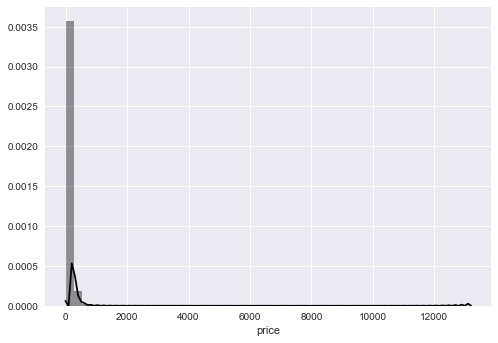

In [21]:
price_dist = sns.distplot(listings.price.dropna(), color="black") #histogram of the price
plt.show(price_dist)

To make things intelleggible, we will cut out the top $1\%$ and the top $5\%$

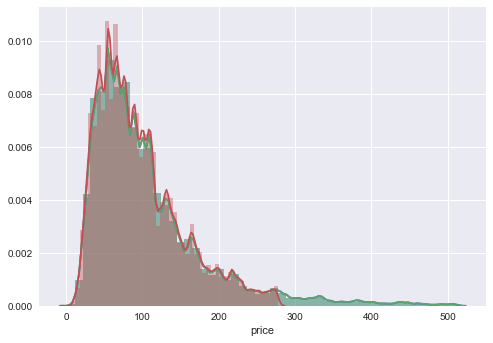

In [24]:
price_filter = listings["price"]<listings.price.quantile(0.99)
price99_dist = sns.distplot(listings[price_filter].price.dropna())
price_filter95 = listings["price"]<listings.price.quantile(0.95)
listings_notails95 = listings[price_filter95]
price95_dist = sns.distplot(listings_notails95.price.dropna())
plt.show(price99_dist, price99_dist)

#### Fitting the distribution

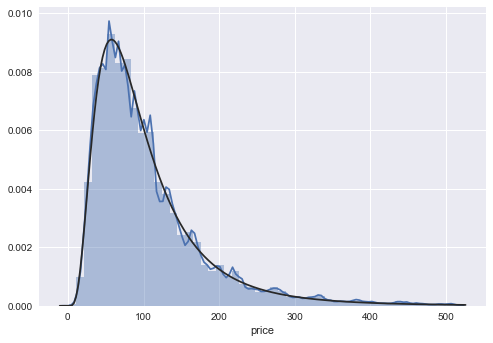

In [27]:
from scipy import stats #statistics library 

#fitting with an F distribution
price99_dist_fit_f = sns.distplot(listings[price_filter].price.dropna(), fit=stats.f)

plt.show(price99_dist_fit_f)


https://en.wikipedia.org/wiki/F-distribution
    
https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.f.html#scipy.stats.f



In [28]:
stats.f.fit(listings[price_filter].price.dropna()) #fit of the F distribution

(11.476510358322585,
 9.3428609079068323,
 0.98906660686449188,
 83.222248983956916)

In [29]:
price_array = listings[price_filter].price.dropna().as_matrix()

stats.kstest(price_array, "f", args=(11.476510358322585, #Kolmogorov-Smirnov test with the parameters obtained above
 9.3428609079068323,
 0.98906660686449188,
 83.222248983956916))

KstestResult(statistic=0.01573679609423112, pvalue=0.0)

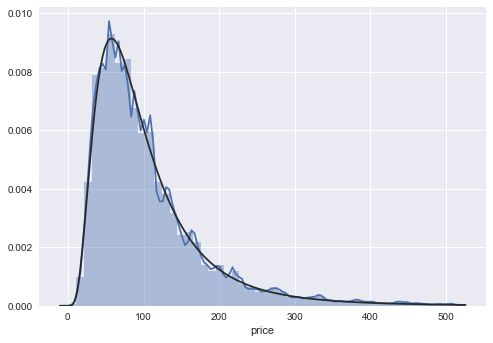

In [30]:
#fitting with a betaprime distribution

price99_dist_fit_bp = sns.distplot(listings[price_filter].price.dropna(), fit=stats.betaprime)
plt.show(price99_dist_fit_bp)

https://en.wikipedia.org/wiki/Beta_prime_distribution

http://mathworld.wolfram.com/BetaPrimeDistribution.html

https://link.springer.com/article/10.1007%2FBF02613934

In [31]:
#fit of the betaprime distribution
stats.betaprime.fit(listings[price_filter].price.dropna())

(6.3493729099444316,
 4.5717917035830844,
 -0.2130443612144739,
 60.233744295944831)

In [32]:
#Kolmogorov-Smirnov test with the parameters obtained above
stats.kstest(price_array, "betaprime", args=(6.3493729099444316, 4.5717917035830844, -0.2130443612144739,60.233744295944831))

KstestResult(statistic=0.016444619269758376, pvalue=0.0)

In [33]:
price99_dist_fit_bp = sns.distplot(listings[price_filter].price.dropna(), fit=stats.betaprime, hist=False)

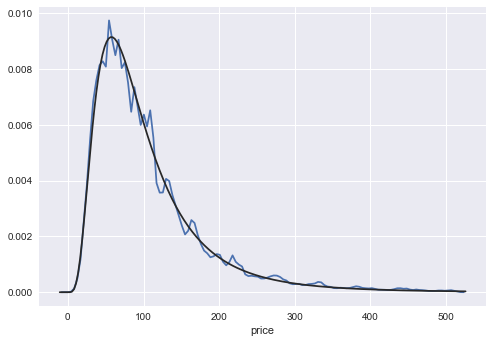

In [34]:
#A comparison of the KDE and the betaprime distribution
plt.show(price99_dist_fit_bp)

#### Conclusions

There isn't much to be excited about here. Both the F and the $\beta^\prime$ distribution represent quite well the distribution of our population, but the sample is too noisy to get a good fit.

What's interesting is that the $\beta^\prime$ distribution is the distribution of the odds ratio associated with a random variable with the $\beta$ distribution. This is often the characteristics of **random** probabilities.

In other terms, the price distribution seems to suggests a random natural occurrence.

### The Cities 

#### Let's bring the cities into the mix

##### Price(time aggregate) vs City

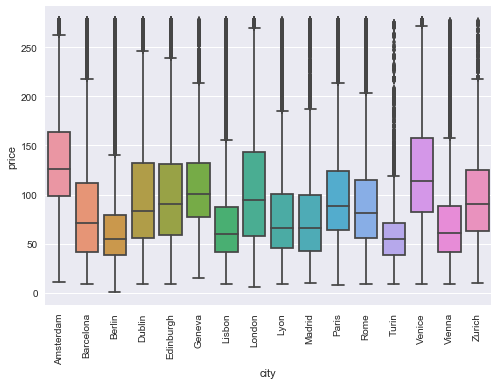

In [37]:
sns.set_style("darkgrid")
sns.set_palette("Paired")
box_city95 = sns.boxplot(x=listings_notails95["city"], y=listings_notails95["price"])
plt.xticks(rotation=90)
plt.show(box_city95)

For this graphic, we have chosen again a cutoff at the $95\%$ quantile to enhance legibility.

We can see how there are strong differences in the price related to the city. As we could have exptected, smaller cities with a huge tourism influx like Amsterdam and Venice have the highest median price. Right after that we find Geneva and Zurich, two of the most expensive cities in the world 
The largest city, London, has the widest spread. 

http://www.telegraph.co.uk/travel/galleries/most-expensive-cities-in-the-world/city5/

http://go.euromonitor.com/Top-100-Cities-Destinations_Download-Page.html?utm_campaign=FR-170126-Top%20100%20Cities%20Destinations&utm_medium=Blog&utm_source=Blog

#### Price (grouped by room type) vs city

Another question is wether certain type of accomodations are more expensive:

In [42]:
#It works better if it is repetead here
sns.set_style("dark", {"axes.facecolor": "ivory"}) #setting the background


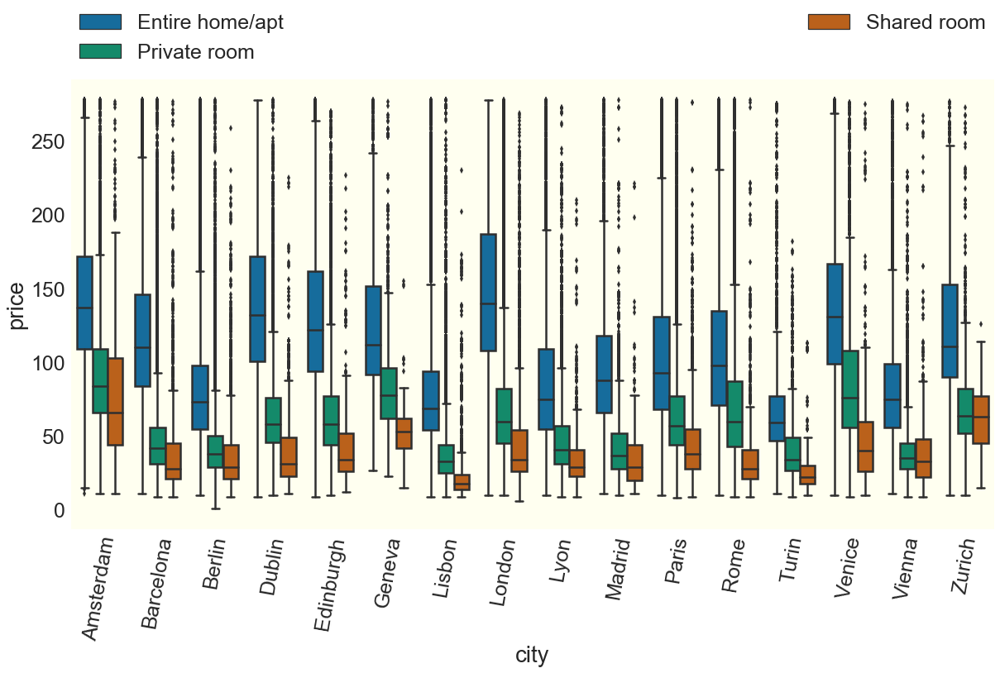

In [41]:
plt.rcParams['figure.figsize'] =20,10
plt.xticks(rotation=80)
sns.set_style("dark", {"axes.facecolor": "ivory"})

box_twice = sns.boxplot(data=listings_notails95, x="city", y="price", hue="room_type", \
                        hue_order=["Entire home/apt", "Private room", "Shared room"], palette="colorblind")
sns.despine(left=True)
sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 2.5})
#box_twice.legend(loc="upper right")
plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,
           ncol=2, mode="expand", borderaxespad=0.)
plt.show(box_twice)

At a glance, we can see that the price for an entire property is consistently higher than the price of a private room, which is always higher than a shared room.

Generally speaking, it can also be noted that the distribution of prices for entire properties is always wider. This suggest that the price could be influenced by the size of the property (that we know) or the level of luxury (which is harder to estimate from our dataset).

As a side note, of we look at the most expensive city, Amsterdam, we can notice that the distribution of the shared rooms prices is also quite wide. This could be linked to the combination fo high prices and popularity with a younger audience (https://www.studentuniverse.com/travel-guides/top-lists/top-10-cities-to-visit-in-europe).

#### Price vs number of guests (time aggregate)


We are now interested in understanding how the "accommodates" variable, i.e. the number of guest that a listing can accommodate, influences the price.

This analysis is split by city and by type of listing, since we expect the increase in the number of guests to have a different outcome on, say, the price of an entire home or the price of a shared room.

In [43]:
#Revert to default style
sns.set()
#Whitegrid style
sns.set_style("whitegrid")

#### *Average*  price (time aggregate) vs Number of guests ("accommodates") per City and per room type

**Warning!** Slow code

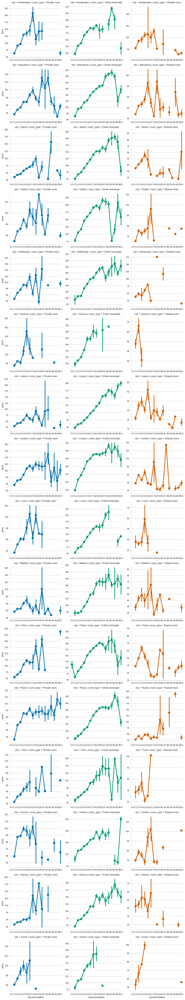

In [44]:
#This code is a bit slow. It plots for each city and accommodation type
#the average price for a given max number of guest, with a confidence interval of 95%
avg_fg = sns.factorplot(x="accommodates", y="price", hue="room_type", data=listings_notails95, row="city", col="room_type", estimator=np.mean, ci=95, n_boot=500, col_order=None, size=4, aspect=1, palette="colorblind", sharex=False, sharey=False, margin_titles=False)
plt.show(avg_fg)

#### Median price (time aggregate) vs Number of guests ("accommodates") per City and per room type

**Warning!** Slow code

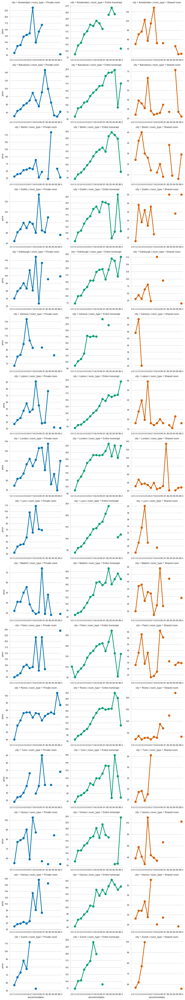

In [45]:
#This code may be a bit slow. It plots for each city and accommodation type
#the average price for a given max number of guest

med_fg = sns.factorplot(x="accommodates", y="price", hue="room_type", data=listings_notails95, row="city", col="room_type", estimator=np.median, ci=None, col_order=None, size=4, aspect=1, palette="colorblind", sharex=False, sharey=False, margin_titles=False)
plt.show(med_fg)

Regarding the private rooms, we can see how the price tends to increase with the number of guests, until it starts to oscillate, suggesting that the sample of private rooms for many guests is smaller.

If we look at the entire properties, we can see how in most cases the price rises monotonically,slowing down after 6-8 guests, suggesting that beyond additional guest carry a smaller marginal gain cost.

The datasets for the shared rooms are definitely noisier, but if we look at London, we can recognize an obviuos trend: after a small increase from one to two guests, the price tends to drop.

##### To better understand this trend we will plot the boxplot of the same datasets for a few select towns: Paris, Rome (my hometown), London (I'm here at the moment) and Edinburgh.

In [48]:
sns.set_style("dark", {"axes.facecolor": "ivory"})

##### London

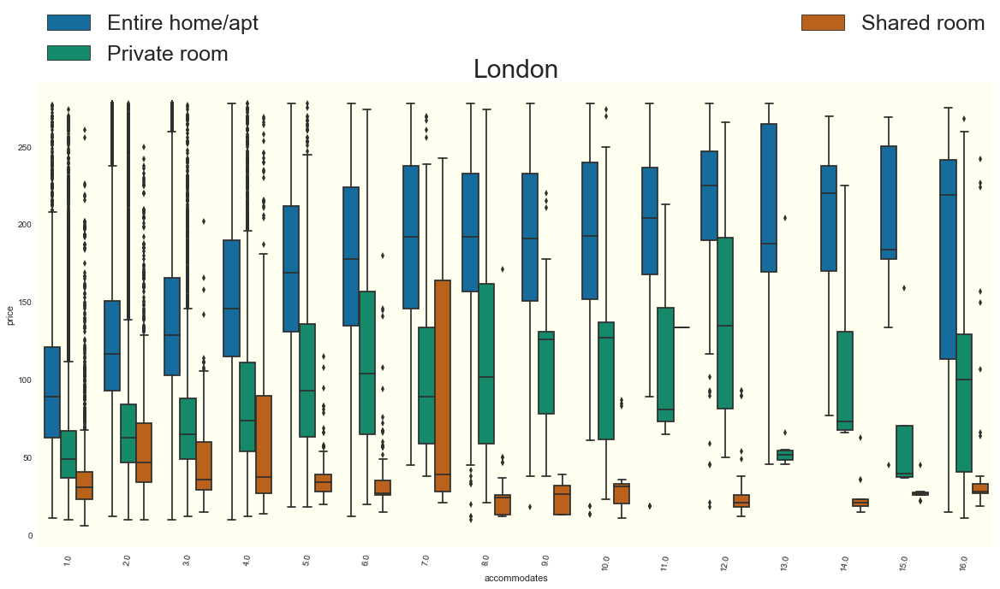

In [49]:
plt.rcParams['figure.figsize'] =20,10
plt.xticks(rotation=80)
sns.set_style("dark", {"axes.facecolor": "ivory"})

London_listings95 = listings_notails95[listings_notails95.city=="London"]

box_acc_lon = sns.boxplot(data=London_listings95, x="accommodates", y="price", hue="room_type", \
                        hue_order=["Entire home/apt", "Private room", "Shared room"], palette="colorblind")
sns.despine(left=True)
sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 2.5})
#box_twice.legend(loc="upper right")
plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,
           ncol=2, mode="expand", borderaxespad=0.)
plt.title("London")

plt.show(box_acc_lon)

##### Paris

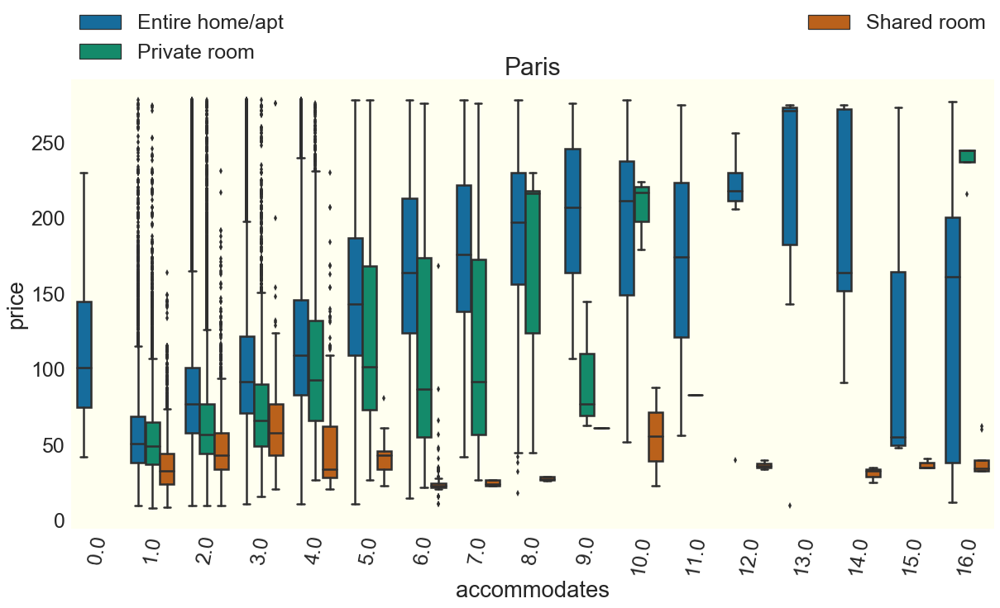

In [50]:
plt.rcParams['figure.figsize'] =20,10
plt.xticks(rotation=80)
sns.set_style("dark", {"axes.facecolor": "ivory"})

Paris_listings95 = listings_notails95[listings_notails95.city=="Paris"]

box_acc_par = sns.boxplot(data=Paris_listings95, x="accommodates", y="price", hue="room_type", \
                        hue_order=["Entire home/apt", "Private room", "Shared room"], palette="colorblind")
sns.despine(left=True)
sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 2.5})
#box_twice.legend(loc="upper right")
plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,
           ncol=2, mode="expand", borderaxespad=0.)
plt.title("Paris")

plt.show(box_acc_par)

Clearly an apartment for 0 guests for 100 $\$$ a night must be a surveying mistake

##### Rome

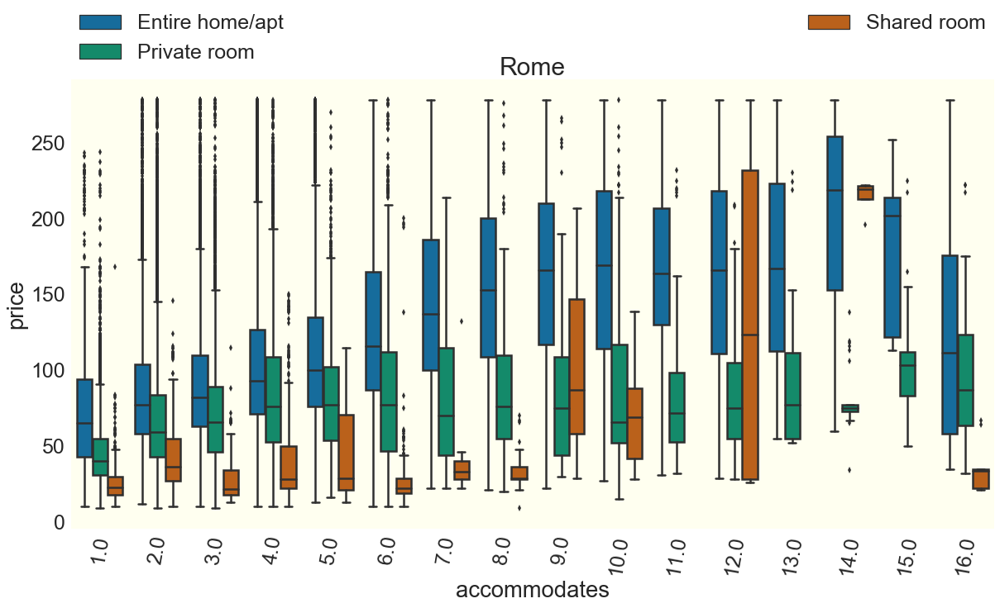

In [52]:
plt.rcParams['figure.figsize'] =20,10
plt.xticks(rotation=80)
sns.set_style("dark", {"axes.facecolor": "ivory"})

Rome_listings95 = listings_notails95[listings_notails95.city=="Rome"]

box_acc_rom = sns.boxplot(data=Rome_listings95, x="accommodates", y="price", hue="room_type", \
                        hue_order=["Entire home/apt", "Private room", "Shared room"], palette="colorblind")
sns.despine(left=True)
sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 2.5})
#box_twice.legend(loc="upper right")
plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,
           ncol=2, mode="expand", borderaxespad=0.)
plt.title("Rome")

plt.show(box_acc_rom)

##### Rome

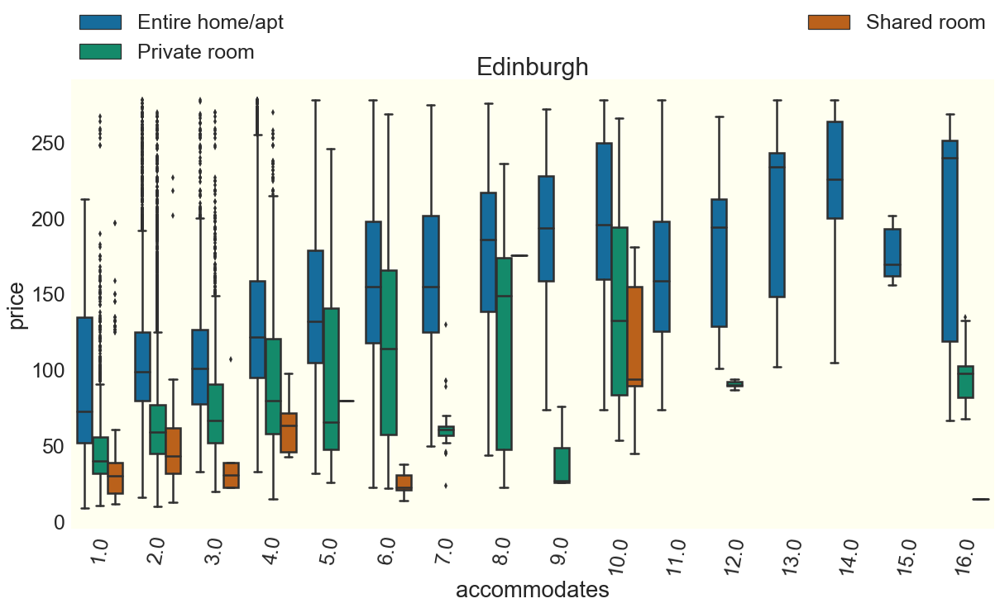

In [53]:
plt.rcParams['figure.figsize'] =20,10
plt.xticks(rotation=80)
sns.set_style("dark", {"axes.facecolor": "ivory"})

Edinburgh_listings95 = listings_notails95[listings_notails95.city=="Edinburgh"]

box_acc_edi = sns.boxplot(data=Edinburgh_listings95, x="accommodates", y="price", hue="room_type", \
                        hue_order=["Entire home/apt", "Private room", "Shared room"], palette="colorblind")
sns.despine(left=True)
sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 2.5})
#box_twice.legend(loc="upper right")
plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,
           ncol=2, mode="expand", borderaxespad=0.)
plt.title("Edinburgh")

plt.show(box_acc_edi)

#### What are the most common type of properties?

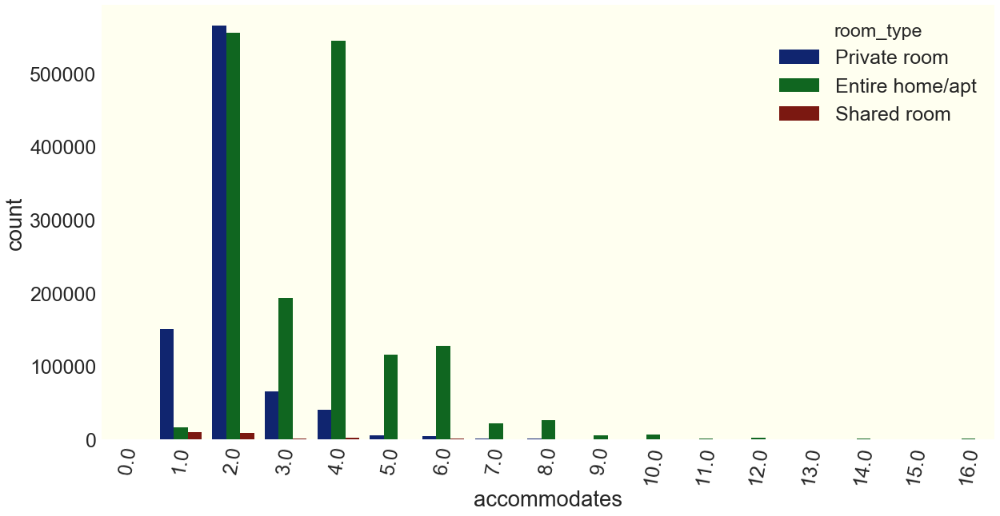

In [54]:
plt.rcParams['figure.figsize'] =20,10
plt.xticks(rotation=80)
sns.set_style("dark", {"axes.facecolor": "ivory"})

count_of_rooms = sns.countplot(x="accommodates", data=listings_notails95, hue="room_type", palette="dark")
plt.show(count_of_rooms)

In [56]:
sns.set()
sns.set_style("white")


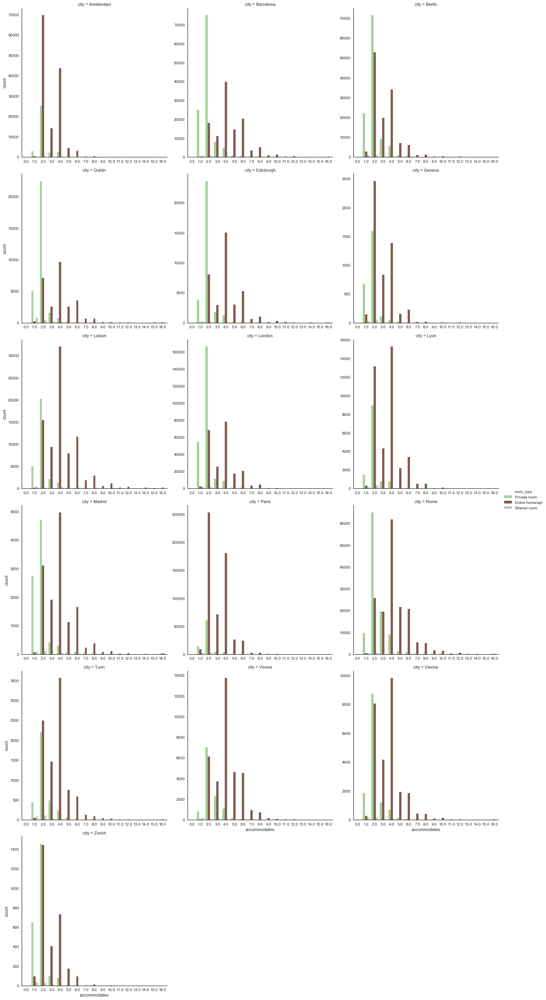

In [60]:
count_fg = sns.factorplot(x="accommodates", hue="room_type", data=listings_notails95, col="city", col_wrap=3, estimator=np.median, ci=None, col_order=None, size=6, aspect=1, kind="count", palette="tab20", sharex=False, sharey=False, margin_titles=False)
plt.show(count_fg)

Overall , private rooms for 2 guests and entire properties for 2 and 4 guests are the most common. Citywise, 1 guest private rooms are relatively very popular in the business hubs of London, Dublin, Madrid, and Zurich. Less so in Paris.

#### Where are the properties?

In [64]:
sns.set_style("dark", {"axes.facecolor": "ivory"})
sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 2.5})


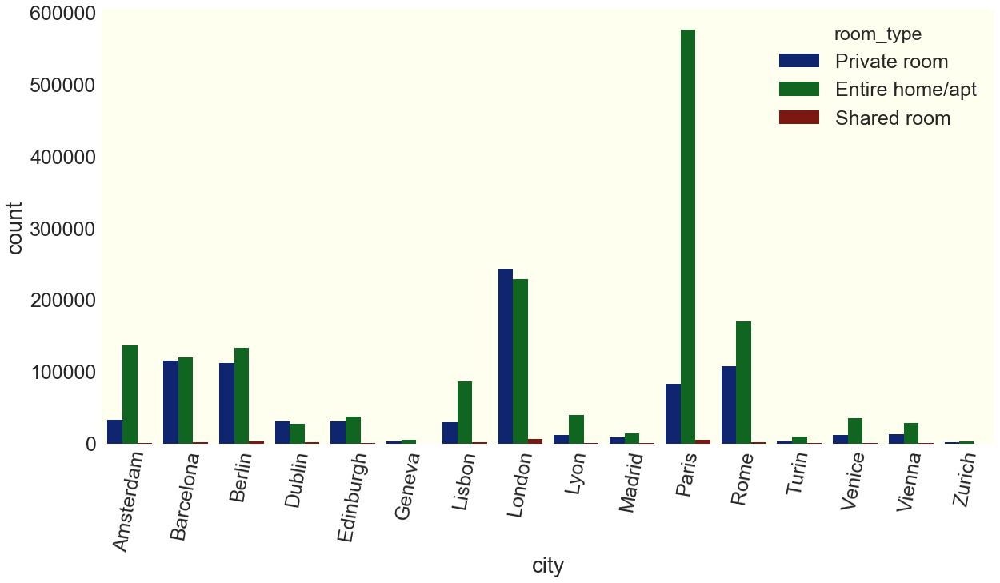

In [65]:
plt.rcParams['figure.figsize'] =20,10
plt.xticks(rotation=80)
sns.set_style("dark", {"axes.facecolor": "ivory"})

count_per_city = sns.countplot(x="city", data=listings_notails95, hue="room_type", palette="dark")
plt.show(count_per_city)

In London and Paris, is the answer. Anyone who is surprised by the disportion between entire properties and shared room in Paris has never seen the size of an average Paris apartment (<---- this is a completely scientific statement) 

### Geography and time

In [66]:
#Default setting
sns.set()

In [69]:
#Whitegrid style
sns.set_style("whitegrid")

#### First, London

Here we will have a look at the geographical distribution of the $95\%$ quantile of **Private rooms for two guests in London** over time

In [70]:
#slicing the dataframe
lon_pvtroom_2 = listings_notails95[(listings_notails95["city"]=="London")&( listings_notails95["room_type"]=="Private room")&(listings_notails95["accommodates"]==2.0)]         

**Warning!** slow code!

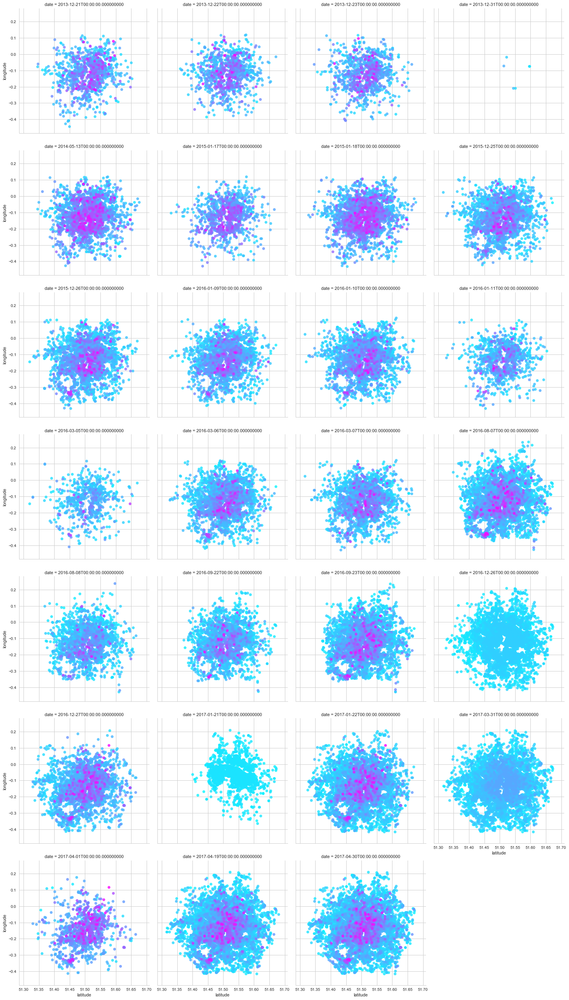

In [71]:
lpvt2 = sns.lmplot(x="latitude", y="longitude", data=lon_pvtroom_2, hue="price", col="date", row=None, palette="cool", col_wrap=4, size=5, aspect=1, markers='o', sharex=True, sharey=True, hue_order=None, col_order=None, row_order=None, scatter=True, fit_reg=False, legend=False)
plt.show(lpvt2)

Two observations here: 

1. We immediately notice a problem: some survey are split in two frames: timestamps have been normalized at midnight (otherwise they would have been impossible to manage) and so when the survey happened over night some listings fall in one bin and others in the next. survey_id is not recorded for all survey and it is not an alternative

2. Lighter blue dots are cheaper listings, purple dots more expensive one. We can see the market boom, with a higher concentration of purple dots in the city centre and cheaper rentals sprawling in the suburbs.

#### All the cities

We will do the same here for all the cities. **Warning**: the code is slow, and Paris may not display. The latter is due to a limitation of Jupyter 5.0, that should be fixed in Jupyter 5.1

Amsterdam


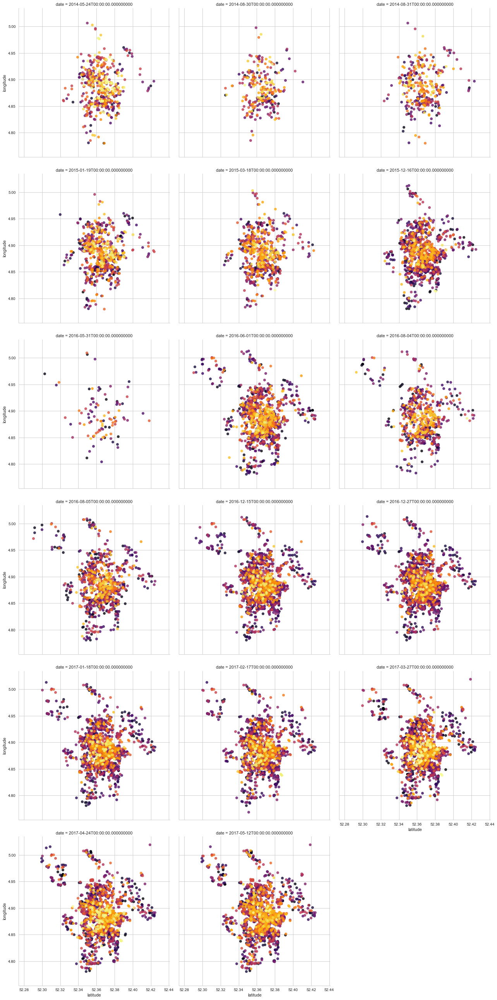

Barcelona


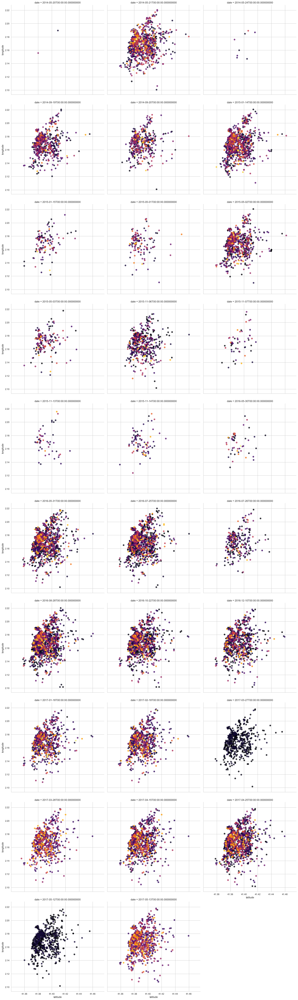

Berlin


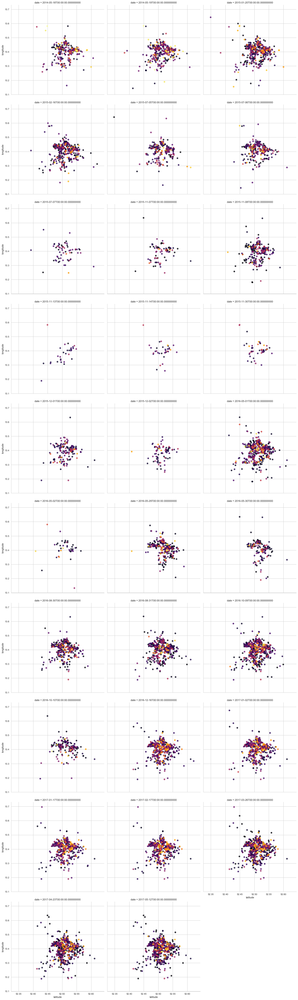

Dublin


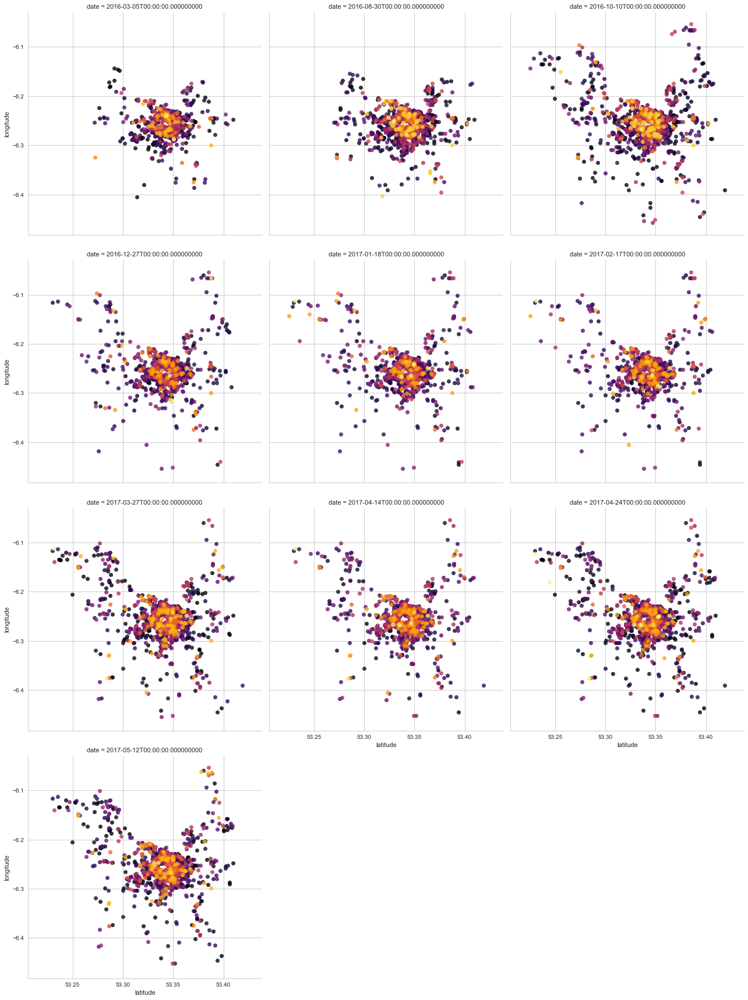

Edinburgh


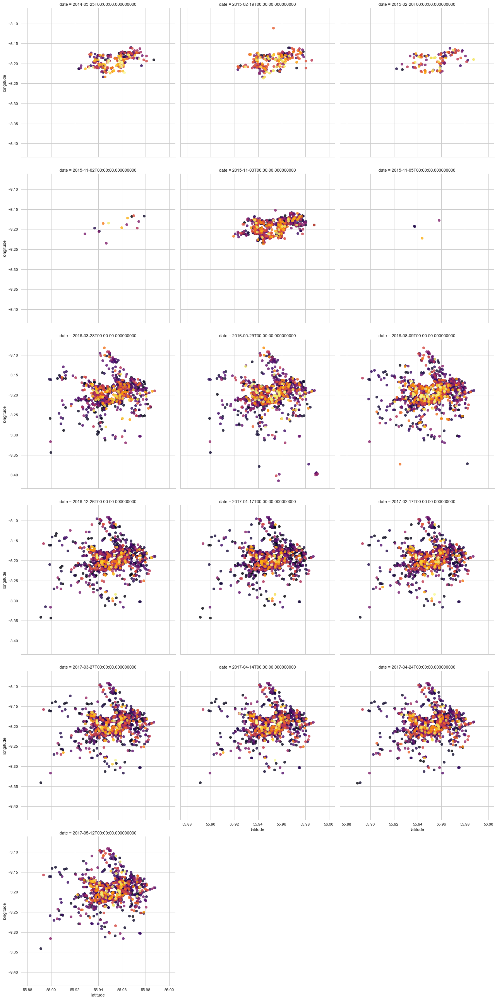

Geneva


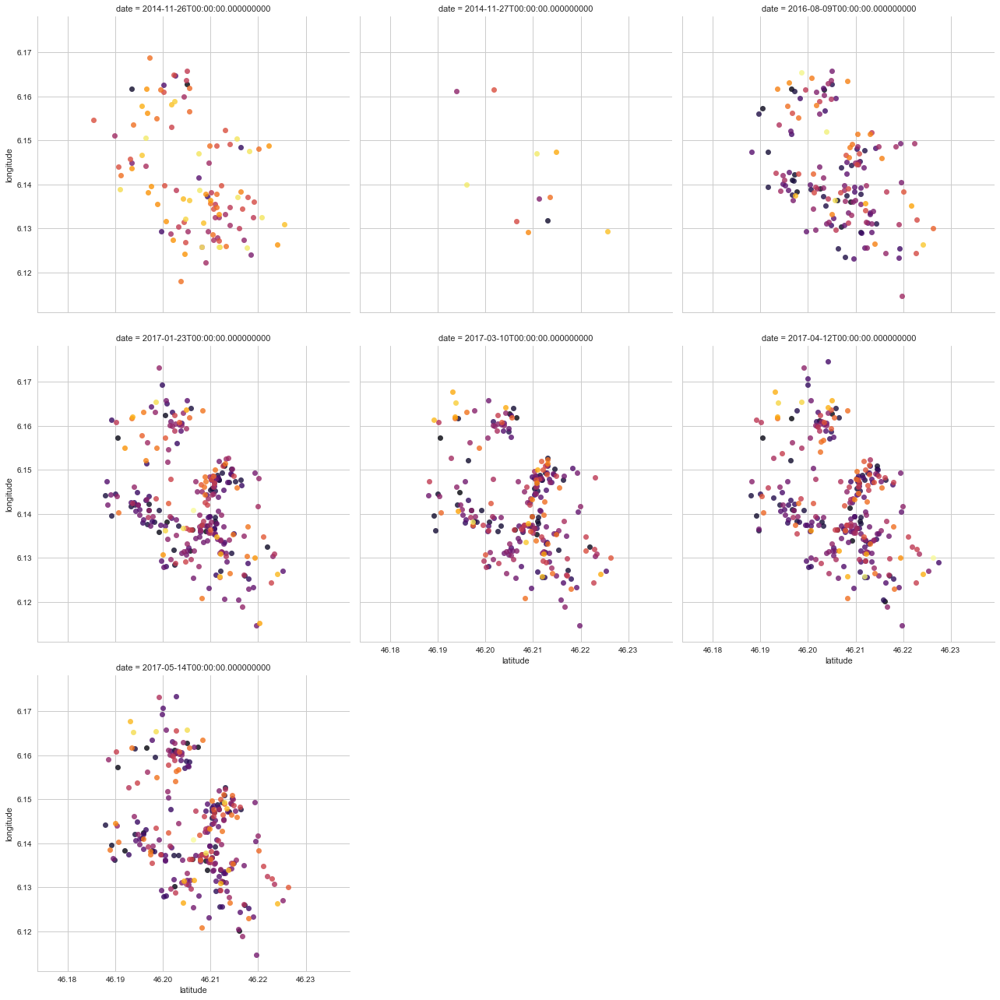

Lisbon


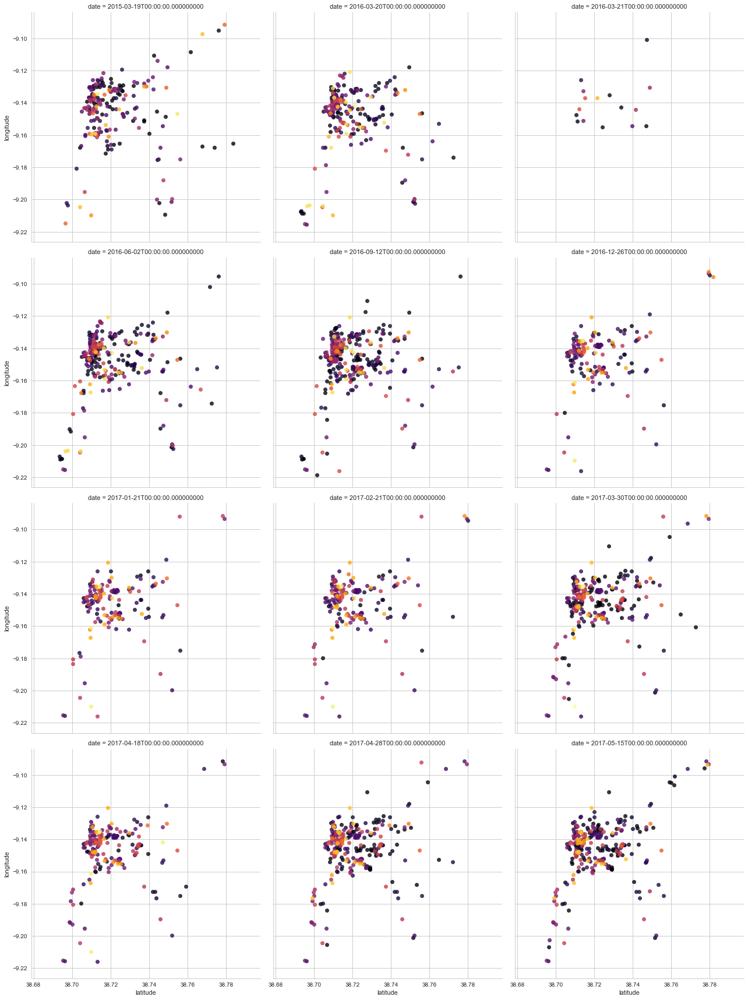

London


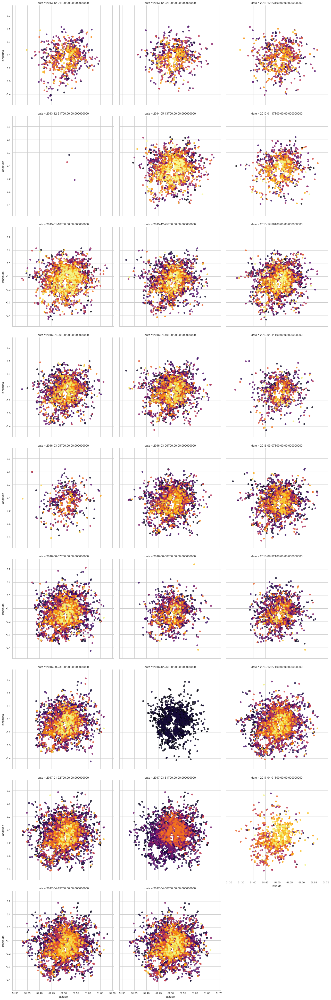

Lyon


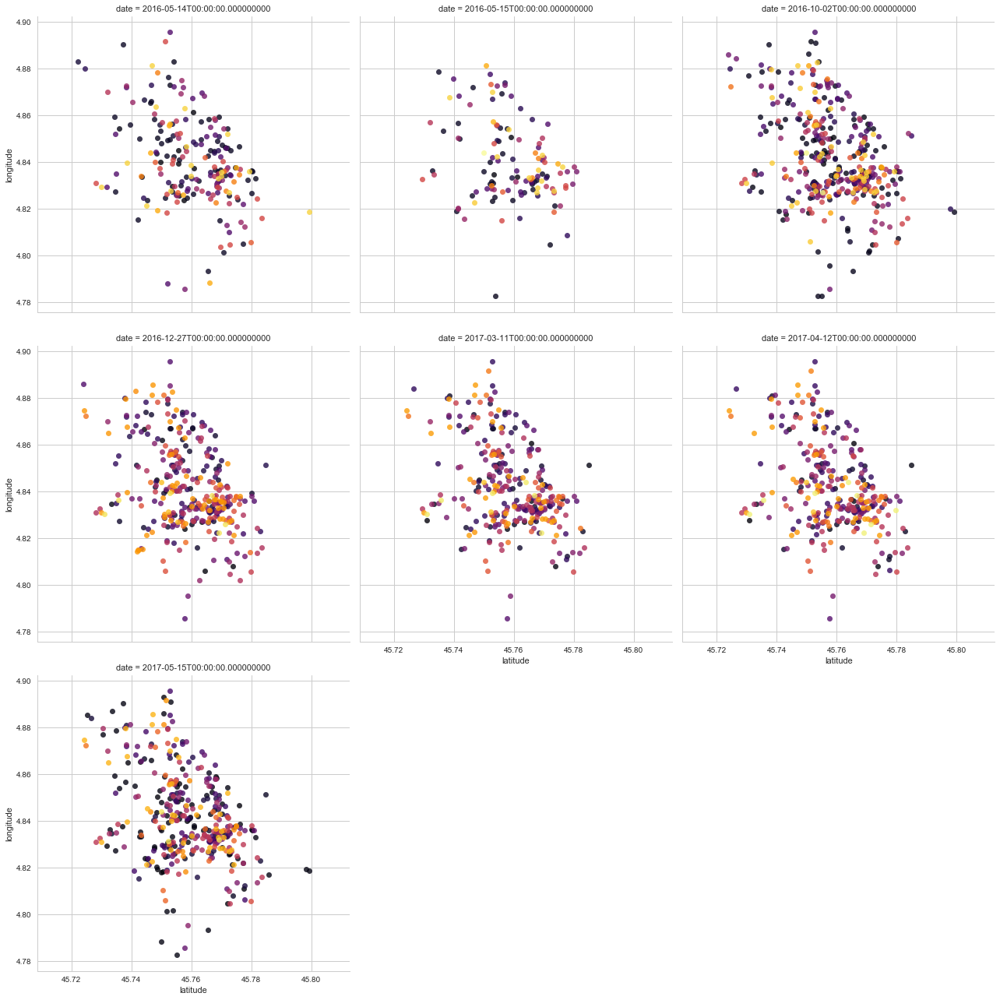

Madrid


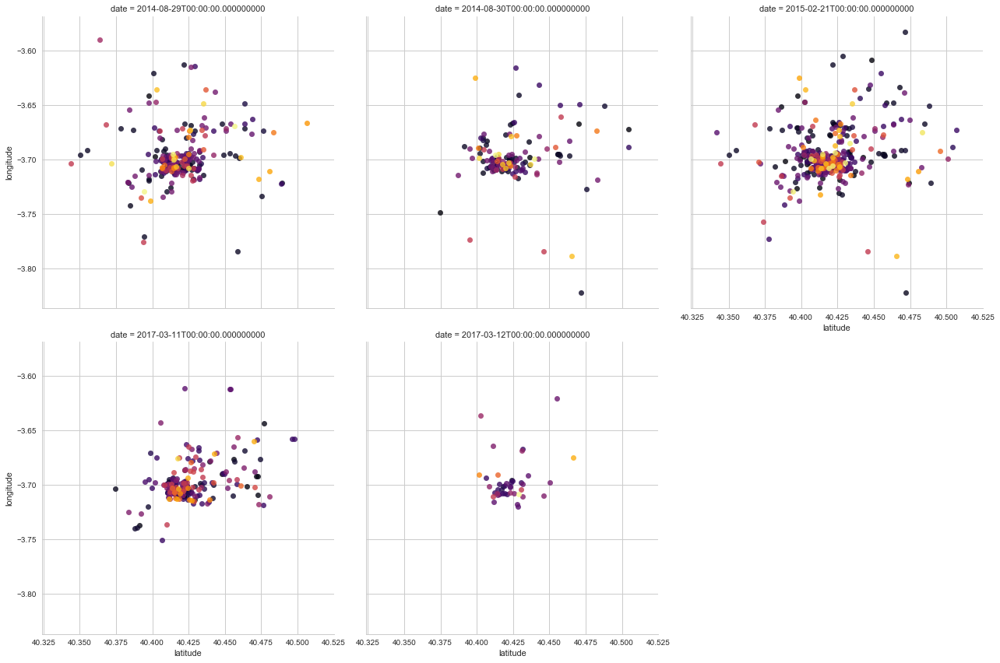

Paris


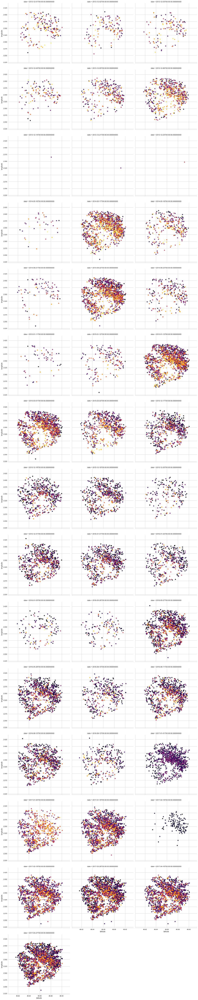

Rome


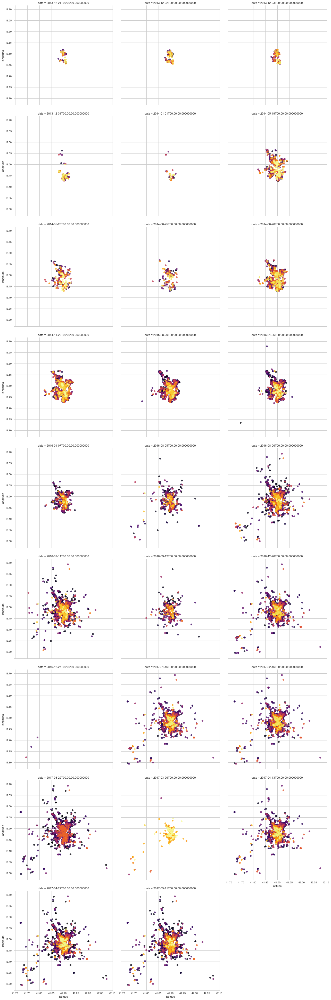

Turin


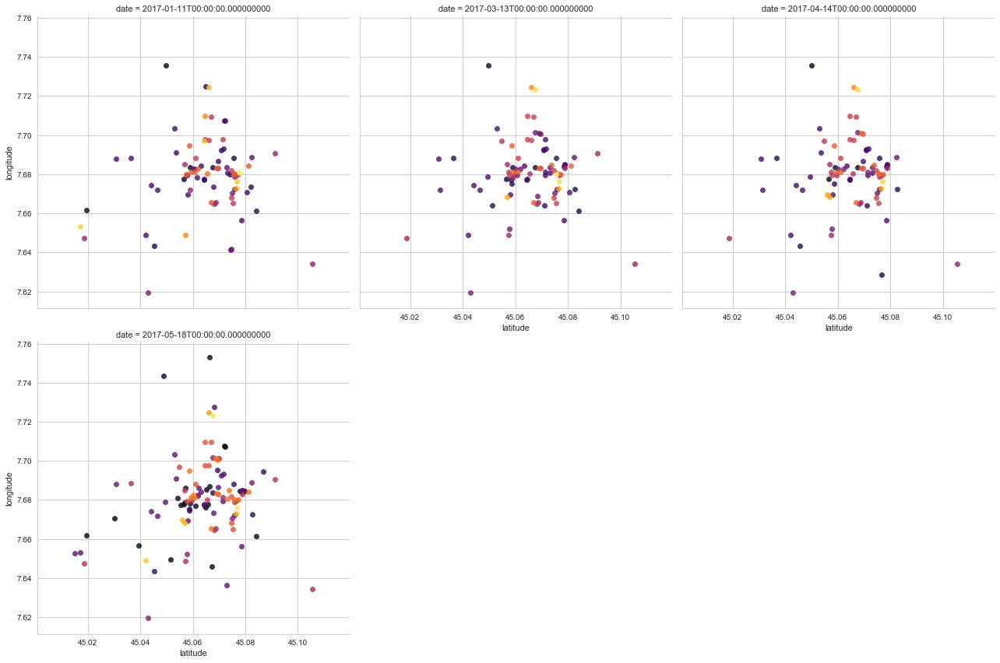

Venice


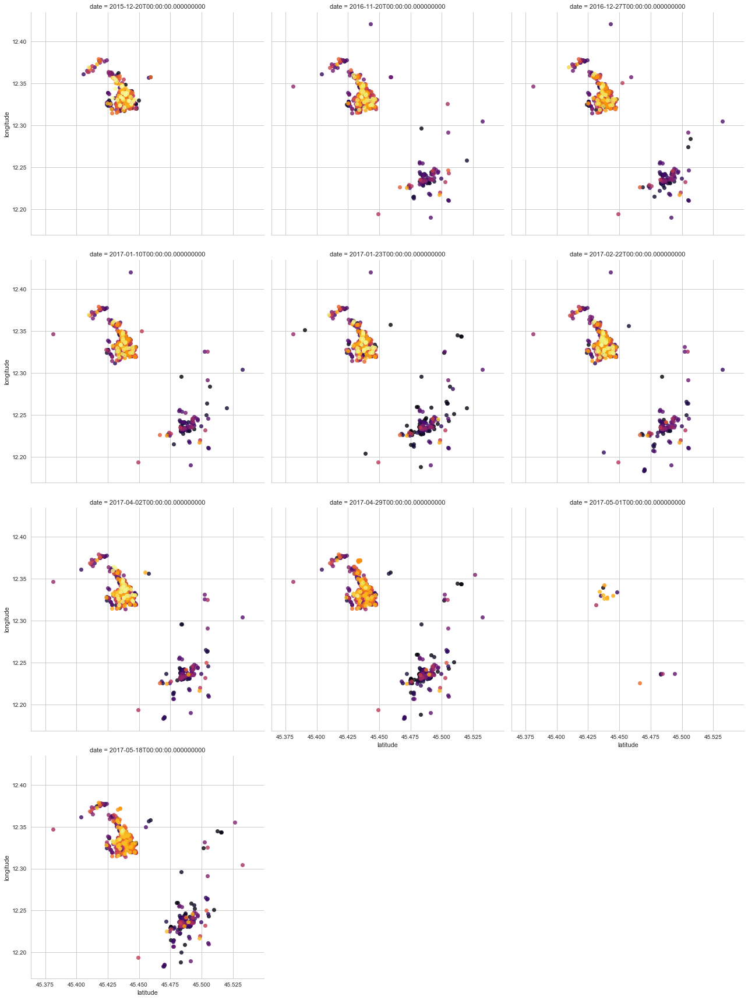

Vienna


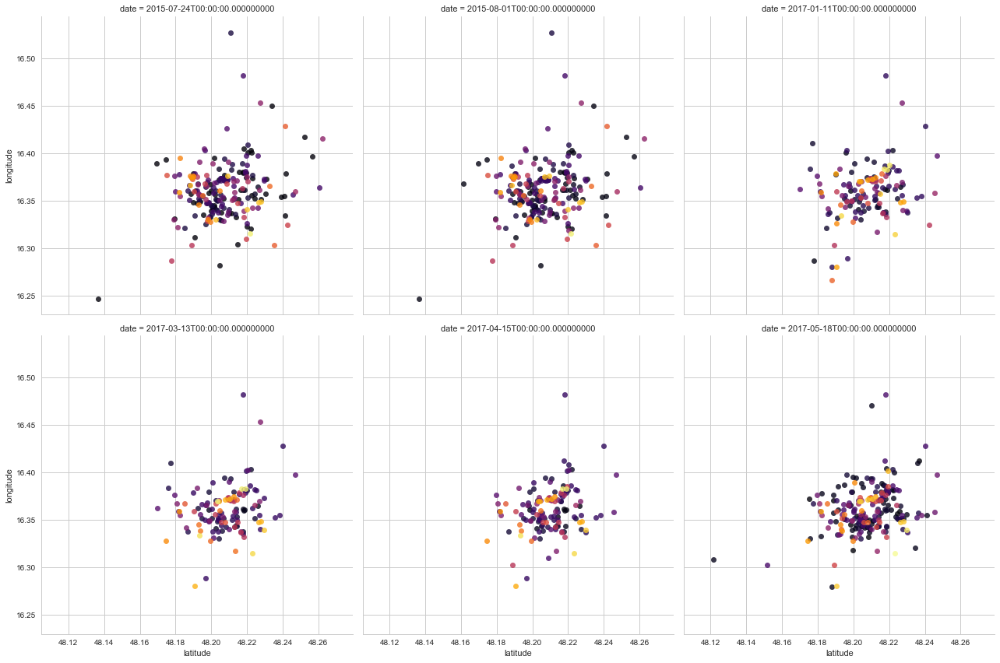

Zurich


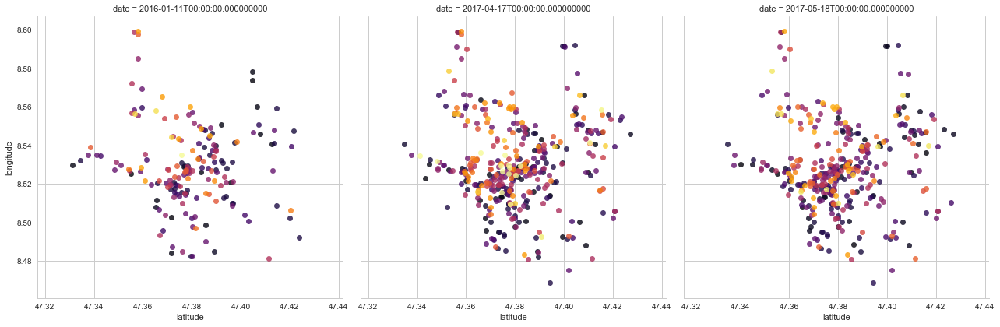

In [72]:
for city in listings_notails95.city.unique(): #selecting the city
    #slicing
    city_pvt_2_exp = listings_notails95[(listings_notails95["city"]==city)&( listings_notails95["room_type"]=="Private room")&(listings_notails95["accommodates"]==2.0)&(listings_notails95["price"]<listings_notails95.price.quantile(0.75))&(listings_notails95["price"]>listings_notails95.price.quantile(0.25))]
    print(city)
    #plotting, grouping by date and coloring by price
    exp_pvtr_2_onmap = sns.lmplot(x="latitude", y="longitude", data=city_pvt_2_exp, hue="price", col="date", row=None, palette="inferno", col_wrap=3, size=6, aspect=1, markers='o', sharex=True, sharey=True, hue_order=None, col_order=None, row_order=None, scatter=True, fit_reg=False, legend=False)
    plt.show(exp_pvtr_2_onmap)

footnote: in Venice we can clearly see how Airbnb intially took old on the islands, later appearing in the Lido.

### Some considerations on correlations

The above would let us hope that there is a correlation between the position of a listing and its price. Unfortunately this is not the case.

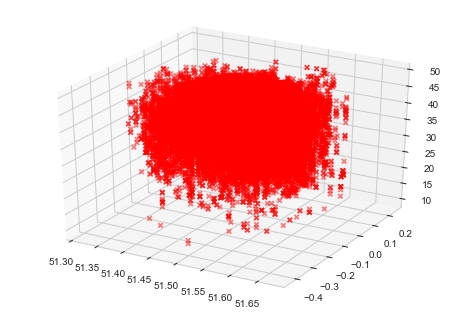

In [75]:
from mpl_toolkits.mplot3d import Axes3D #tools for 3D plotting
london_pvt2_under50=lon_pvtroom_2[lon_pvtroom_2.price<50] #selecting private double under 50 $

x=london_pvt2_under50.latitude.as_matrix()

y=london_pvt2_under50.longitude.as_matrix()

z=london_pvt2_under50.price.as_matrix()

sns.set_style("whitegrid")
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, alpha=0.5, c="red", marker="x")
plt.show(fig)

If we look at the geographical distribution of the cheapest private double rooms in London, we can see that they are everywhere. Comparing it to the distribution of the more expensive (see below), we can see that expensive listings are rarer in the suburbs, but the position alone is not a good predictor of the price. 

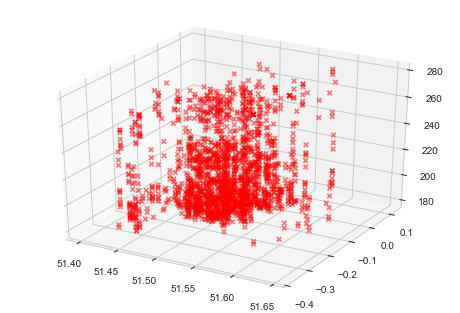

In [77]:
london_pvt2_over180=lon_pvtroom_2[lon_pvtroom_2.price>180] #selecting private double over 180 $

x=london_pvt2_over180.latitude.as_matrix()

y=london_pvt2_over180.longitude.as_matrix()

z=london_pvt2_over180.price.as_matrix()

sns.set_style("whitegrid")
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, alpha=0.5, c="red", marker="x")
plt.show(fig)

##### Boroughs

If we plot the boxplot of the prices divided by borough, which are reported for London, and that we can consider as geographical bins, we can see (below) that differences between the most expensive and the cheapest neighbourghoods exist. Yet, the distributions overlap

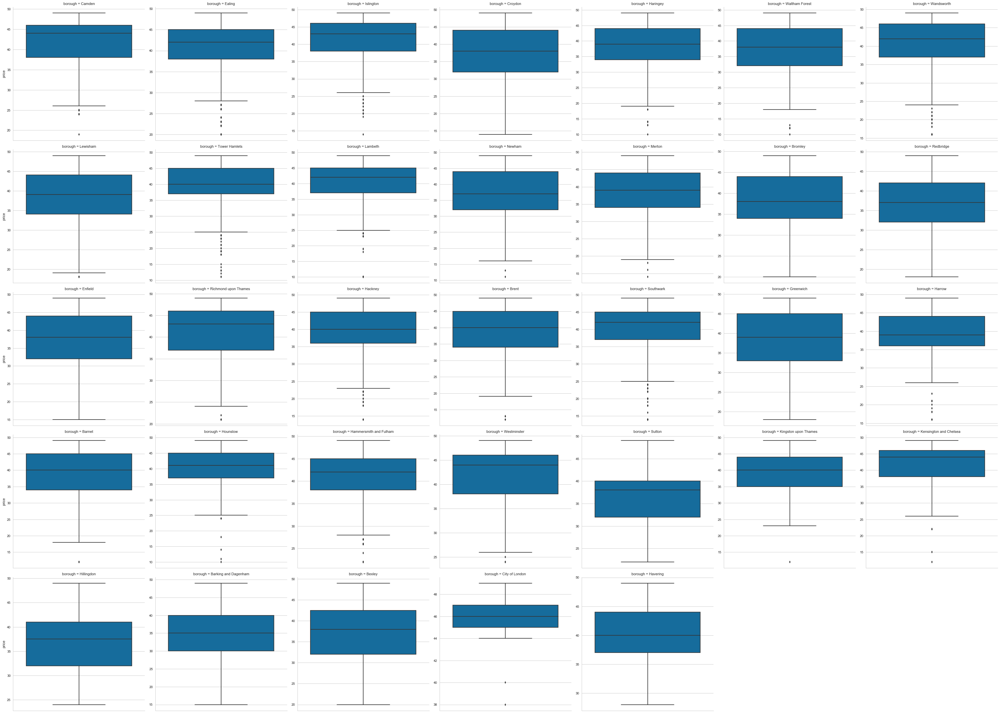

In [79]:
london_pvt2_under200=lon_pvtroom_2[lon_pvtroom_2.price<50]
box_bor = sns.factorplot( y="price", hue="borough", data=london_pvt2_under200, col="borough", kind="box", ci=None, col_order=None, col_wrap=7, size=6, aspect=1, palette="colorblind", sharex=False, sharey=False, margin_titles=False)
plt.show(box_bor)

#### Pearson correlations

In [80]:
listings.corr(method="pearson") #correlations between columns: Pearson r

,Unnamed: 0,accommodates,bathrooms,bedrooms,host_id,latitude,longitude,minstay,overall_satisfaction,price,reviews,room_id,survey_id
Unnamed: 0,1.000000,-0.250388,NaN,-0.252736,0.097742,0.159517,-0.156488,-0.001080,-0.135833,-0.171584,-0.057253,0.151900,NaN
accommodates,-0.250388,1.000000,0.250729,0.711768,-0.048751,-0.145180,-0.007861,-0.000843,0.019184,0.417995,0.033145,-0.035174,0.014162
bathrooms,NaN,0.250729,1.000000,0.395443,-0.070742,-0.102324,0.006992,-0.006113,0.041394,0.249716,-0.047649,-0.040768,NaN
bedrooms,-0.252736,0.711768,0.395443,1.000000,-0.047390,-0.074535,-0.030613,-0.000356,0.001199,0.415234,-0.018816,-0.040382,0.026415
host_id,0.097742,-0.048751,-0.070742,-0.047390,1.000000,0.018274,-0.021626,-0.001372,-0.257621,-0.065492,-0.180169,0.632174,0.029681
latitude,0.159517,-0.145180,-0.102324,-0.074535,0.018274,1.000000,-0.027141,0.001713,-0.007352,0.065157,-0.092179,0.053363,-0.050959
longitude,-0.156488,-0.007861,0.006992,-0.030613,-0.021626,-0.027141,1.000000,0.002917,-0.010874,-0.063056,-0.009150,-0.055510,0.168235
minstay,-0.001080,-0.000843,-0.006113,-0.000356,-0.001372,0.001713,0.002917,1.000000,0.018807,0.001146,-0.000968,-0.002021,NaN
overall_satisfaction,-0.135833,0.019184,0.041394,0.001199,-0.257621,-0.007352,-0.010874,0.018807,1.000000,-0.017746,0.328411,-0.405711,0.044829
price,-0.171584,0.417995,0.249716,0.415234,-0.065492,0.065157,-0.063056,0.001146,-0.017746,1.000000,-0.059635,-0.059332,-0.012428


#### Spearman correlations

In [81]:
listings.corr(method="spearman")#correlations between columns: Spearman rho

,Unnamed: 0,accommodates,bathrooms,bedrooms,host_id,latitude,longitude,minstay,overall_satisfaction,price,reviews,room_id,survey_id
Unnamed: 0,1.000000,-0.268873,NaN,-0.287539,0.135720,0.030477,-0.083109,-0.038952,-0.106195,-0.268908,-0.103015,0.159512,NaN
accommodates,-0.268873,1.000000,0.225892,0.626844,-0.084602,-0.140946,0.004164,0.171704,0.003766,0.545603,0.067116,-0.055159,-0.000187
bathrooms,NaN,0.225892,1.000000,0.340309,-0.055464,-0.102416,0.005630,0.041486,0.054956,0.258274,-0.043338,-0.037001,NaN
bedrooms,-0.287539,0.626844,0.340309,1.000000,-0.070611,-0.037030,-0.053690,0.147906,0.019408,0.457491,0.000954,-0.050736,0.032890
host_id,0.135720,-0.084602,-0.055464,-0.070611,1.000000,0.037365,-0.033401,-0.161825,-0.176138,-0.164563,-0.202013,0.622920,0.017745
latitude,0.030477,-0.140946,-0.102416,-0.037030,0.037365,1.000000,0.033846,0.018555,0.046305,0.073583,-0.055248,0.062395,0.022515
longitude,-0.083109,0.004164,0.005630,-0.053690,-0.033401,0.033846,1.000000,0.035163,0.014978,-0.087941,-0.004483,-0.072355,0.060453
minstay,-0.038952,0.171704,0.041486,0.147906,-0.161825,0.018555,0.035163,1.000000,0.075238,0.193059,0.023995,-0.141093,NaN
overall_satisfaction,-0.106195,0.003766,0.054956,0.019408,-0.176138,0.046305,0.014978,0.075238,1.000000,0.069386,0.563894,-0.302492,0.091826
price,-0.268908,0.545603,0.258274,0.457491,-0.164563,0.073583,-0.087941,0.193059,0.069386,1.000000,-0.063313,-0.148715,0.015030


In [82]:
#correlations between columns grouped by city, property type and number of guests: Pearson r
group_of_rooms_corr = listings.groupby(["city", "room_type", "accommodates"]).corr(method="pearson")
group_of_rooms_corr

Unnamed: 0  \
city      room_type       accommodates                                    
Amsterdam Entire home/apt 1.0          Unnamed: 0              1.000000   
                                       bathrooms                    NaN   
                                       bedrooms               -0.175138   
                                       host_id                 0.195943   
                                       latitude                0.009370   
                                       longitude              -0.160063   
                                       minstay                -0.092521   
                                       overall_satisfaction   -0.315431   
                                       price                  -0.378678   
                                       reviews                 0.115835   
                                       room_id                 0.386532   
                                       survey_id                    NaN   
                          2.0          Unnamed: 0              1.000000   
                                       bathrooms                    NaN   
                                       bedrooms               -0.080656   
                                       host_id                 0.198620   
                                       latitude                0.106544   
                                       longitude              -0.026411   
                                       minstay                -0.012412   
                                       overall_satisfaction   -0.151435   
                                       price                  -0.444082   
                                       reviews                 0.018768   
                                       room_id                 0.327771   
                                       survey_id                    NaN   
                          3.0          Unnamed: 0              1.000000   
                                       bathrooms                    NaN   
                                       bedrooms               -0.096459   
                                       host_id                 0.169278   
                                       latitude                0.125733   
                                       longitude               0.004424   
...                                                                 ...   
Zurich    Shared room     3.0          minstay                      NaN   
                                       overall_satisfaction         NaN   
                                       price                        NaN   
                                       reviews                      NaN   
                                       room_id                      NaN   
                                       survey_id                    NaN   
                          4.0          Unnamed: 0                   NaN   
                                       bathrooms                    NaN   
                                       bedrooms                     NaN   
                                       host_id                      NaN   
                                       latitude                     NaN   
                                       longitude                    NaN   
                                       minstay                      NaN   
                                       overall_satisfaction         NaN   
                                       price                        NaN   
                                       reviews                      NaN   
                                       room_id                      NaN   
                                       survey_id                    NaN   
                          16.0         Unnamed: 0                   NaN   
                                       bathrooms                    NaN   
                                       bedrooms                     NaN   
           

A look at the correlation table above confirfms that there does not seem to be a single good predictor of the price of a listing.

What we will attempt is a K-Nearest Neighbours regression that takes into account all the factors according to that our visual analysis seem to influence the price.

### KNN regression

In [83]:
from numpy.random import permutation
from sklearn.neighbors import KNeighborsRegressor
import warnings
warnings.filterwarnings("ignore")

In [84]:
#subset
listings5_95=listings[(listings["price"]<listings.price.quantile(0.95)) & (listings["price"]>listings.price.quantile(0.5))]

train_n_test = listings5_95[["room_id", "city", "room_type", "accommodates", "latitude", "longitude", "price"]]

In [85]:
#split the dataset randomly in train and tst
train_or_test_array = ["Train", "Test"]
flag = np.random.choice(train_or_test_array, len(train_n_test))
train_n_test["Type"]=flag

In [86]:
#assign numerical values to categorical variables
train_n_test["city"]=train_n_test["city"].astype("category")
train_n_test["city"]=train_n_test["city"].cat.codes+1

In [87]:
#assign numerical values to categorical variables
train_n_test["room_type"]=train_n_test["room_type"].astype("category")
train_n_test["room_type"]=train_n_test["room_type"].cat.codes+1

In [88]:
#checking for Nan values
train_n_test.isnull().any()

room_id         False
city            False
room_type       False
accommodates     True
latitude        False
longitude       False
price           False
Type            False
dtype: bool

In [89]:
train_n_test.accommodates.median()

4.0

In [91]:
#substitute the Nan values with the median
train_n_test.accommodates=train_n_test["accommodates"].fillna(4.0)

In [92]:
#dividing the train and the test datasets
train=train_n_test[train_n_test['Type']=='Train']
test=train_n_test[train_n_test['Type']=='Test']

#### KNN 5 neighbours

In [93]:
knn = KNeighborsRegressor(n_neighbors=5) #KNN regressor, 5 NN, Minkowski distance
#predictors
x_columns=["city", "room_type", "accommodates", "latitude", "longitude"]
#target
y_columns=["price"]
knn.fit(train[x_columns], train[y_columns])
predictions = knn.predict(test[x_columns])
actual = test[y_columns]
mse = (((predictions - actual) ** 2).sum()) / len(predictions)
mse 

price    1071.544069
dtype: float64

In [94]:
#chisquare test
from scipy import stats
stats.chisquare(actual, predictions)

Power_divergenceResult(statistic=array([ 4291941.33476531]), pvalue=array([ 0.]))

#### KNN 10 neighbours

In [95]:
knn10 = KNeighborsRegressor(n_neighbors=10)  #KNN regressor, 10 NN, Minkowski distance
#predictors
x_columns=["city", "room_type", "accommodates", "latitude", "longitude"]
#target
y_columns=["price"]
knn10.fit(train[x_columns], train[y_columns])
predictions = knn10.predict(test[x_columns])
actual = test[y_columns]
mse = (((predictions - actual) ** 2).sum()) / len(predictions)
mse

price    1302.625678
dtype: float64

In [96]:
#chisquare test
stats.chisquare(actual, predictions)

Power_divergenceResult(statistic=array([ 5202281.25790961]), pvalue=array([ 0.]))

The statistics for this models are appalling, and increasing the number of nearest neighbours (in the parameter space, not the real space) makes the situation worse.

#### London only

##### One date

We will now focus on the one single day in London, trying to minimize the influence of counfunding factors

In [98]:
london_only=listings5_95[listings5_95["city"]=="London"]


In [99]:
london_only.date.unique()

array(['2013-12-22T00:00:00.000000000', '2013-12-21T00:00:00.000000000',
       '2013-12-23T00:00:00.000000000', '2013-12-31T00:00:00.000000000',
       '2014-01-01T00:00:00.000000000', '2014-05-13T00:00:00.000000000',
       '2015-01-18T00:00:00.000000000', '2015-01-17T00:00:00.000000000',
       '2015-12-26T00:00:00.000000000', '2015-12-25T00:00:00.000000000',
       '2016-01-11T00:00:00.000000000', '2016-01-10T00:00:00.000000000',
       '2016-01-09T00:00:00.000000000', '2016-03-07T00:00:00.000000000',
       '2016-03-06T00:00:00.000000000', '2016-03-05T00:00:00.000000000',
       '2016-08-08T00:00:00.000000000', '2016-08-07T00:00:00.000000000',
       '2016-09-23T00:00:00.000000000', '2016-09-22T00:00:00.000000000',
       '2016-12-28T00:00:00.000000000', '2016-12-27T00:00:00.000000000',
       '2017-01-23T00:00:00.000000000', '2017-01-22T00:00:00.000000000',
       '2017-04-02T00:00:00.000000000', '2017-04-01T00:00:00.000000000',
       '2017-03-31T00:00:00.000000000', '2017-04-21

In [100]:
london_only_last_day=london_only[london_only["date"]=='2017-04-30T00:00:00.000000000']

In [102]:
#split the dataset
train_n_test_LoLD=london_only_last_day[["room_id","room_type","borough", "accommodates", "latitude", "longitude", "price"]]
train_or_test_array = ["Train", "Test"]
flag = np.random.choice(train_or_test_array, len(train_n_test_LoLD))
train_n_test_LoLD["Type"]=flag
#assign numerical values to categorical variables
train_n_test_LoLD["borough"]=train_n_test_LoLD["borough"].astype("category")
train_n_test_LoLD["borough"]=train_n_test_LoLD["borough"].cat.codes+1

train_n_test_LoLD["room_type"]=train_n_test_LoLD["room_type"].astype("category")
train_n_test_LoLD["room_type"]=train_n_test_LoLD["room_type"].cat.codes+1

In [104]:
#checking for Nans
train_n_test_LoLD.isnull().any()

room_id         False
room_type       False
borough         False
accommodates    False
latitude        False
longitude       False
price           False
Type            False
dtype: bool

In [105]:
train=train_n_test_LoLD[train_n_test_LoLD['Type']=='Train']
test=train_n_test_LoLD[train_n_test_LoLD['Type']=='Test']
x_columns=["room_type","borough","accommodates", "latitude", "longitude"]
y_column=["price"]

In [107]:
knn = KNeighborsRegressor(n_neighbors=5) #KNN regressor, 5 NN, Minkowski distance
knn.fit(train[x_columns], train[y_column])
predictions_ll = knn.predict(test[x_columns])
actual_ll = test[y_column]
mse_ll = (((predictions_ll - actual_ll) ** 2).sum()) / len(predictions_ll)
mse_ll

price    1225.162449
dtype: float64

In [108]:
a=stats.chisquare(actual_ll, predictions_ll)
print(a, np.sqrt(mse_ll))

Power_divergenceResult(statistic=array([ 21203.85939035]), pvalue=array([ 0.])) price    35.002321
dtype: float64


##### Slightly better, but still awful

### Success at last!

We will now try to predict the type of accomodation given the location, the number of guests and the price **in London on a single day**

In [114]:
x_columns=["price","borough","accommodates", "latitude", "longitude"]
y_column=["room_type"]


In [115]:
knnr = KNeighborsRegressor(n_neighbors=10) #KNN regressor, 10 NN, Minkowski distance
knnr.fit(train[x_columns], train[y_column]) #fit (training)
predictions_r = knnr.predict(test[x_columns]) #prediction
actual_r = test[y_column]
mse_r = (((predictions_r - actual_r) ** 2).sum()) / len(predictions_r)
ar=stats.chisquare(actual_r, predictions_r)

In [116]:
print(ar, np.sqrt(mse_r), mse_r)

Power_divergenceResult(statistic=array([ 11.84014448]), pvalue=array([ 1.])) room_type    0.102169
dtype: float64 room_type    0.010439
dtype: float64


Even if not ideal, at this level we can accept a $\chi^2$ value of $11.8$ and a mse $<1$, and claim to be able to guess the type of accomodation from its geographical location in London, number of guests and price

### Generalize for the whole dataset

In [117]:
train_n_test = listings5_95[["room_id", "city", "room_type", "accommodates", "latitude", "longitude", "price"]]
#split the dataset
train_or_test_array = ["Train", "Test"]
flag = np.random.choice(train_or_test_array, len(train_n_test))
train_n_test["Type"]=flag
train_n_test["city"]=train_n_test["city"].astype("category")
train_n_test["city"]=train_n_test["city"].cat.codes+1

#assign numeric values to categorical variables
train_n_test["room_type"]=train_n_test["room_type"].astype("category")
train_n_test["room_type"]=train_n_test["room_type"].cat.codes+1
train_n_test["room_type"]=train_n_test["room_type"].astype("category")
train_n_test["room_type"]=train_n_test["room_type"].cat.codes+1
#substitute Nan values with median
train_n_test.accommodates=train_n_test["accommodates"].fillna(4.0)
#split the dataset
train=train_n_test[train_n_test['Type']=='Train']
test=train_n_test[train_n_test['Type']=='Test']

In [118]:
x_columns=["city", "price", "accommodates", "latitude", "longitude"]
y_column=["room_type"]
knn_r_all = KNeighborsRegressor(n_neighbors=10)

knn_r_all.fit(train[x_columns], train[y_column])
predictions_r_all = knn_r_all.predict(test[x_columns])
actual_r_all = test[y_column]
mse_r_all = (((predictions_r_all - actual_r_all) ** 2).sum()) / len(predictions_r_all)
mse_r_all

room_type    0.083786
dtype: float64

In [120]:
ar=stats.chisquare(actual_r_all, predictions_r_all)
print(ar)
print("")

print(np.sqrt(mse_r_all))

Power_divergenceResult(statistic=array([ 22002.92615914]), pvalue=array([ 1.]))

room_type    0.289458
dtype: float64


Ok, the model does **not** work taking into consideration the whole dataset. But what about the **time aggregate** of London? 

In [121]:
london_only=listings5_95[listings5_95["city"]=="London"]


In [122]:
#split the dataset
train_n_test_Lo=london_only[["room_id","room_type","borough", "accommodates", "latitude", "longitude", "price"]]
train_or_test_array = ["Train", "Test"]
flag = np.random.choice(train_or_test_array, len(train_n_test_Lo))
train_n_test_Lo["Type"]=flag
#assign numerical values to categorical variables
train_n_test_Lo["borough"]=train_n_test_Lo["borough"].astype("category")
train_n_test_Lo["borough"]=train_n_test_Lo["borough"].cat.codes+1

train_n_test_Lo["room_type"]=train_n_test_Lo["room_type"].astype("category")
train_n_test_Lo["room_type"]=train_n_test_Lo["room_type"].cat.codes+1

In [123]:
#checking for Nans
train_n_test_Lo.isnull().any()

room_id         False
room_type       False
borough         False
accommodates     True
latitude        False
longitude       False
price           False
Type            False
dtype: bool

In [124]:
train_n_test_Lo.accommodates.median()

3.0

In [125]:
#substitute the Nan values with the median
train_n_test_Lo.accommodates=train_n_test_Lo["accommodates"].fillna(3.0)

In [127]:
#dividing the train and the test datasets
train=train_n_test_Lo[train_n_test_Lo['Type']=='Train']
test=train_n_test_Lo[train_n_test_Lo['Type']=='Test']

In [129]:
#selecting the independent and dependent variables
x_columns=["borough", "price", "accommodates", "latitude", "longitude"]
y_column=["room_type"]
knn_r_all = KNeighborsRegressor(n_neighbors=10) #KNN regressor, 10 NN, Minkowsi distance

knn_r_all.fit(train[x_columns], train[y_column])
predictions_r_all = knn_r_all.predict(test[x_columns])
actual_r_all = test[y_column]
mse_r_all = (((predictions_r_all - actual_r_all) ** 2).sum()) / len(predictions_r_all)
mse_r_all

room_type    0.120075
dtype: float64

In [130]:
#goodness of fit
ar=stats.chisquare(actual_r_all, predictions_r_all)
print(ar)
print("")

print(np.sqrt(mse_r_all))

Power_divergenceResult(statistic=array([ 11837.50763889]), pvalue=array([ 1.]))

room_type    0.346519
dtype: float64


no...

## Conclusion

Airbnb lettings are a very complicated market, and it's not possible to fully grasp it all with this data.
Anyhow, if we reduce the parameter space and contain the effect of confounding factors, we can make some powerful predictions with a simple KNN regressor.